In [15]:
import pandas as pd
import numpy as np
import json
import os
import gzip

In [16]:
data_path = '../data/queries-with-predictions.jsonl.gz'

In [32]:
def load_data(file : str):
    output = []
    with gzip.open(file, 'rt') as f:
        for line in f:
            line = json.loads(line)
            query = line['query']
            provider = line['provider']
            timestamp = line['timestamp']
            retrievable = line['retrievable']
            preds = line['qpptk_predictions']

            for dataset, metrics in preds.items():
                qid = metrics.pop('qid')
                for metric, value in metrics.items():
                    record = {}
                    record['query'] = query
                    record['qid'] = qid
                    record['provider'] = provider
                    record['timestamp'] = timestamp
                    record['retrievable'] = retrievable
                    record['dataset'] = dataset
                    record['metric'] = metric
                    record['value'] = value
                    output.append(record)
    return pd.DataFrame.from_records(output)

In [33]:
result = load_data(data_path) 

In [35]:
result.columns

Index(['query', 'qid', 'provider', 'timestamp', 'retrievable', 'dataset',
       'metric', 'value'],
      dtype='object')

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Loop over each performance metric
for metric, metric_df in result.groupby('metric'):
    continue
    # Aggregate performance across queries for each dataset and provider
    agg_df = metric_df.groupby(['dataset', 'provider']).agg(
        mean_value=('value', 'mean'),
        std_value=('value', 'std'),
        count=('value', 'count')
    ).reset_index()
    
    # Optionally compute standard error if you wish to display error bars
    agg_df['se_value'] = agg_df['std_value'] / agg_df['count']**0.5
    
    plt.figure(figsize=(10, 6))
    # Create a bar plot with provider on the x-axis and bars grouped by dataset
    ax = sns.barplot(data=agg_df, x='provider', y='mean_value', hue='dataset', capsize=0.1, palette='viridis')
    plt.title(f"Average Performance for Metric: {metric}")
    plt.xlabel("Provider")
    plt.ylabel("Average Performance Value")
    plt.xticks(rotation=45)
    plt.legend(title='Dataset')
    plt.tight_layout()
    plt.show()

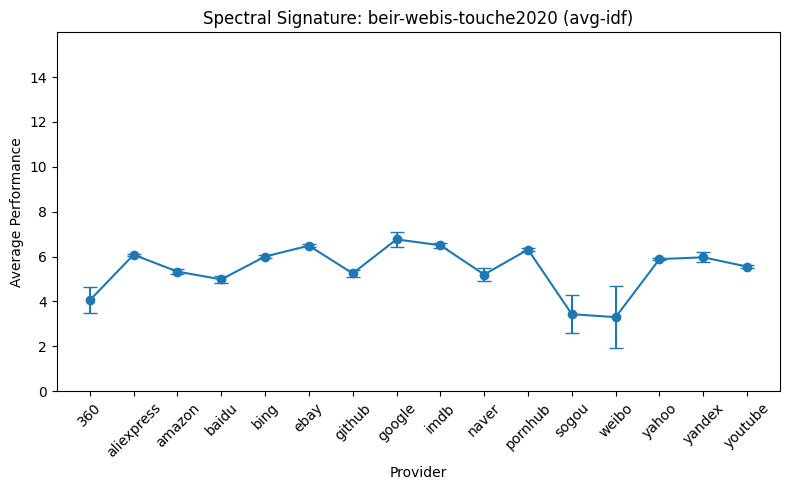

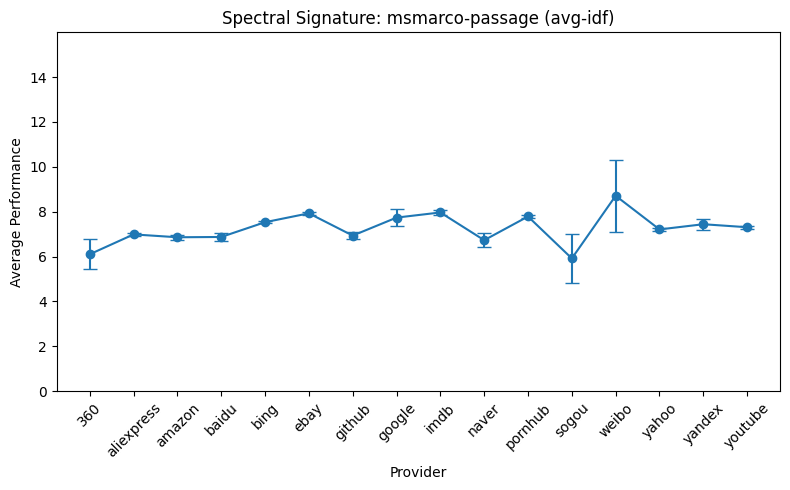

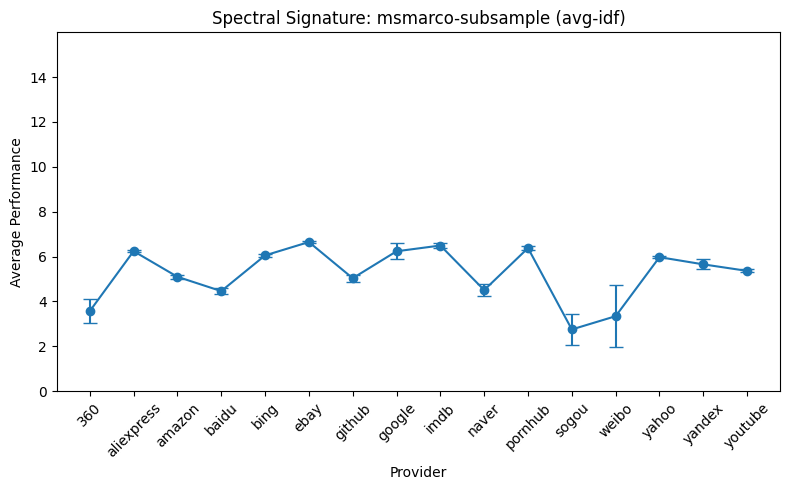

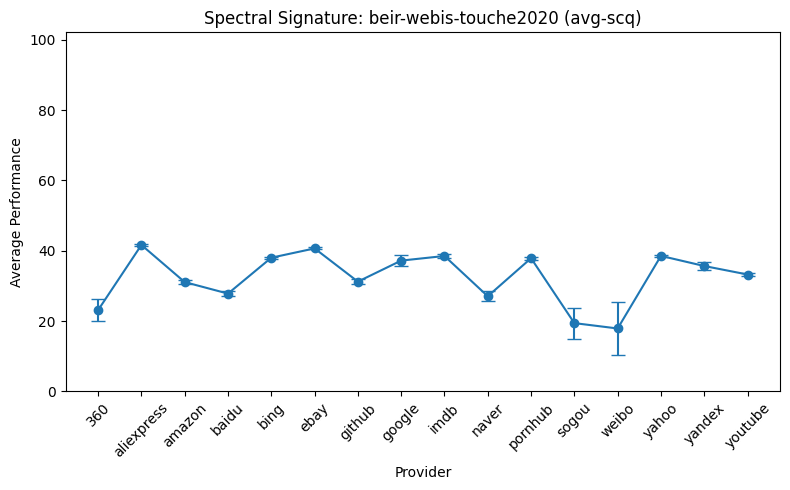

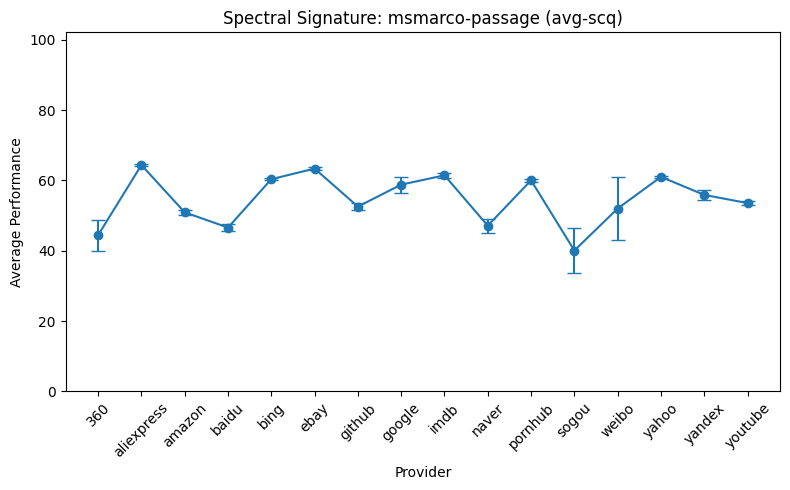

...

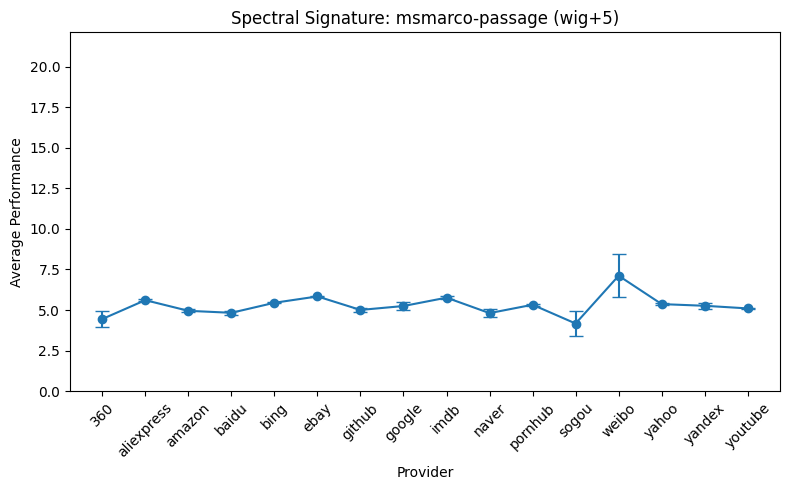

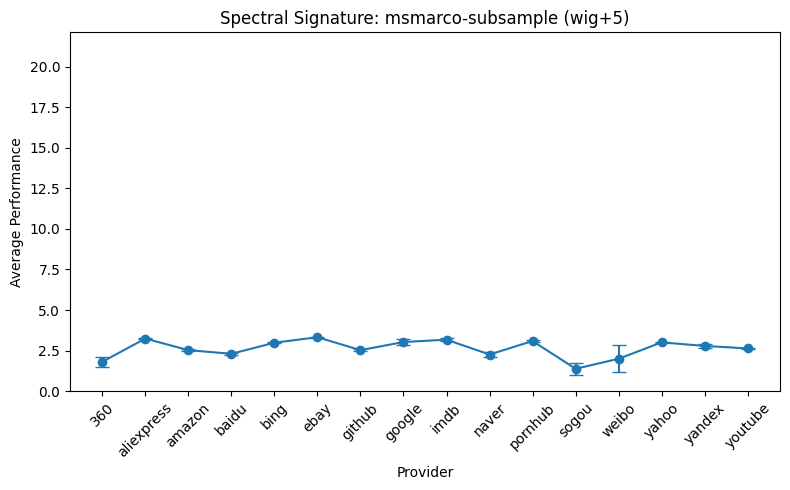

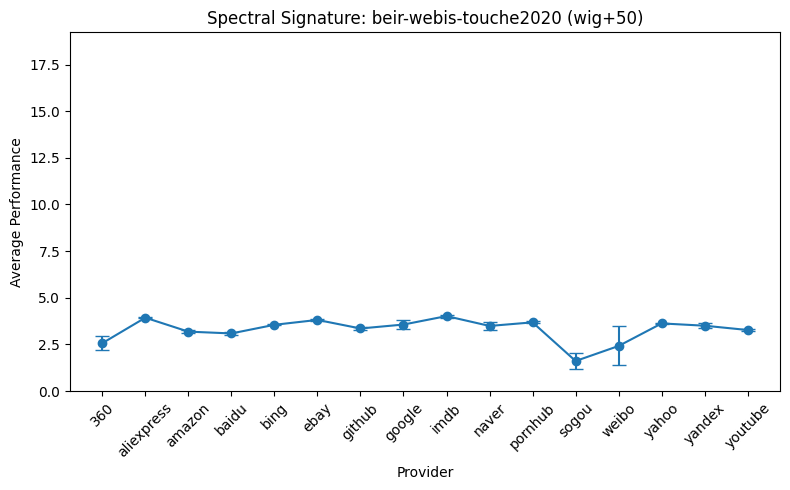

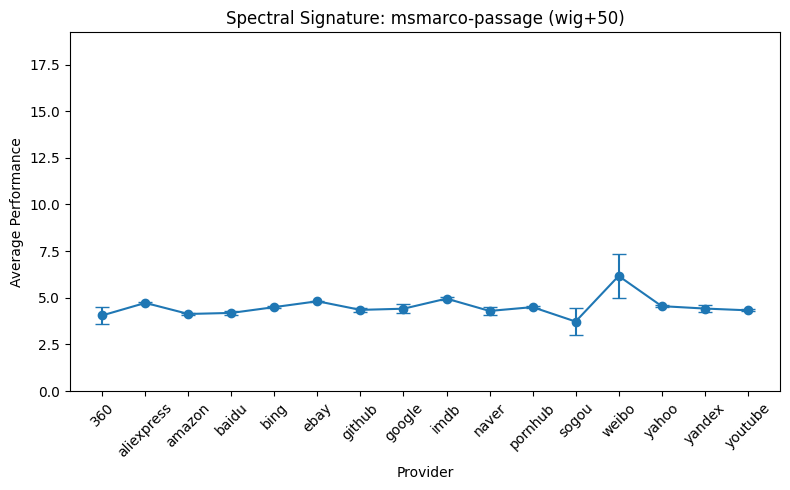

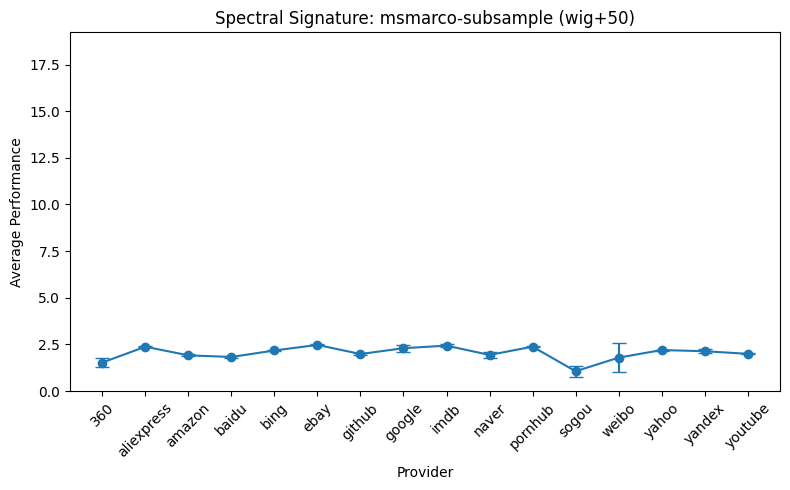

In [41]:
for metric, metric_df in result.groupby('metric'):
    max_val = metric_df['value'].max()
    min_val = metric_df['value'].min()
    for dataset, sub_df in metric_df.groupby('dataset'):
    # Compute the mean and standard error across queries for each provider.
        agg_df = sub_df.groupby('provider').agg(
            mean_value=('value', 'mean'),
            std_value=('value', 'std'),
            count=('value', 'count')
        ).reset_index()
        agg_df['se'] = agg_df['std_value'] / agg_df['count']**0.5
        # Sort providers in a consistent order (if providers are not inherently ordered, consider converting to a categorical type)
        agg_df = agg_df.sort_values('provider')
        
        plt.figure(figsize=(8, 5))
        # Plot the spectral signature: x-axis as providers, y-axis as average performance with error bars.
        plt.errorbar(agg_df['provider'], agg_df['mean_value'], yerr=agg_df['se'], marker='o',
                    linestyle='-', capsize=5)
        plt.ylim(min_val, max_val)
        plt.title(f"Spectral Signature: {dataset} ({metric})")
        plt.xlabel("Provider")
        plt.ylabel("Average Performance")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

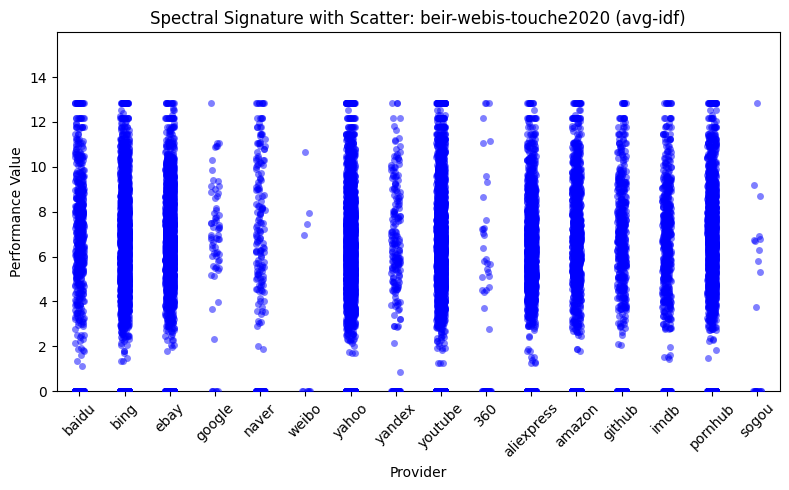

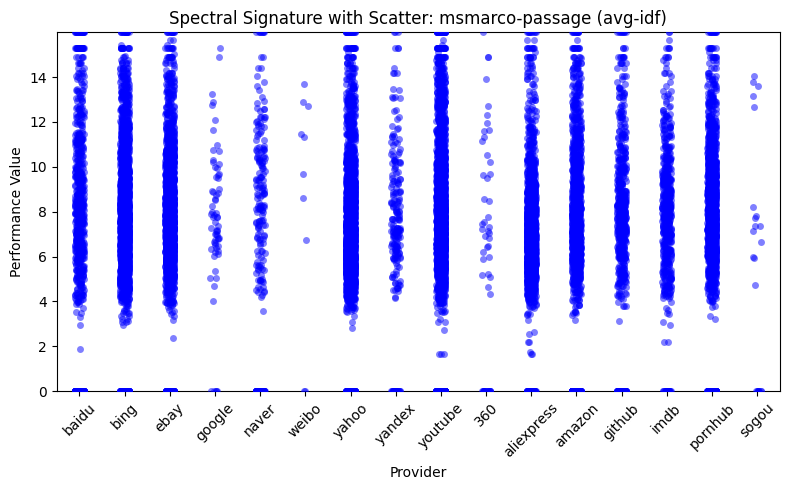

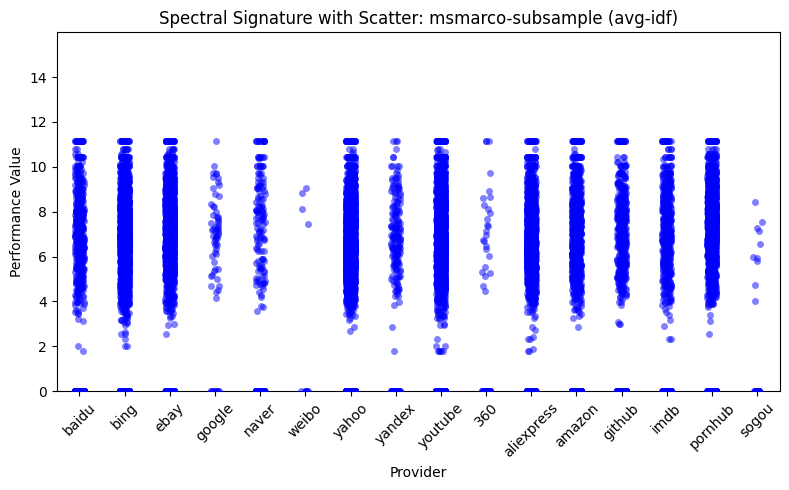

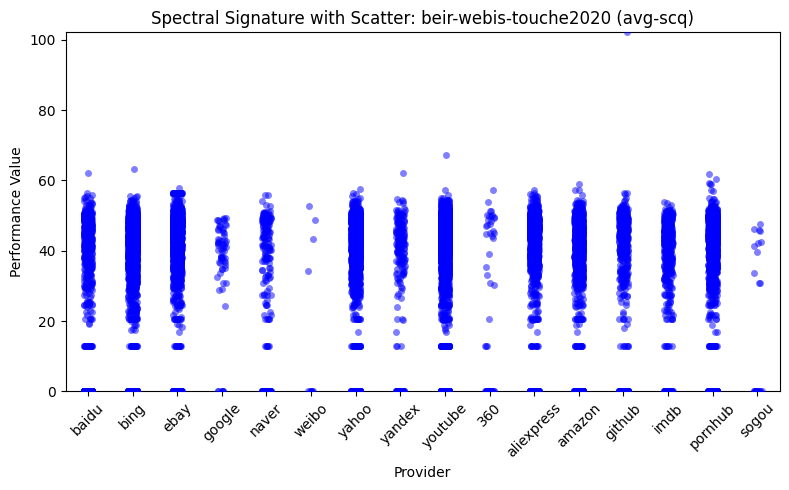

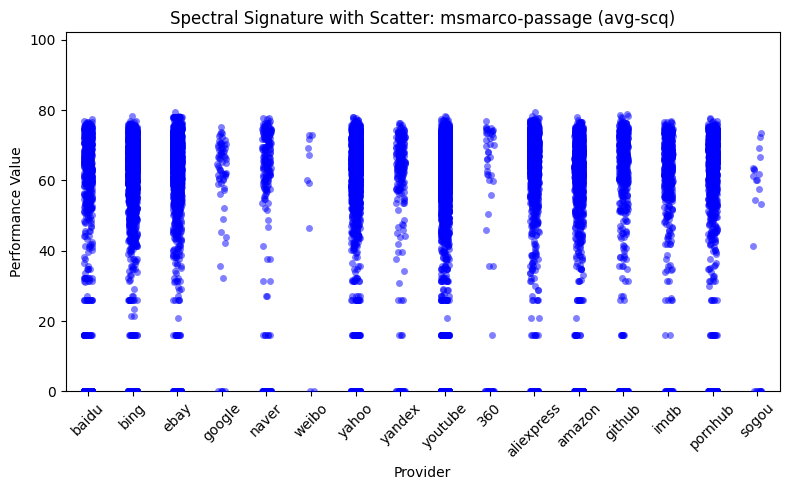

...

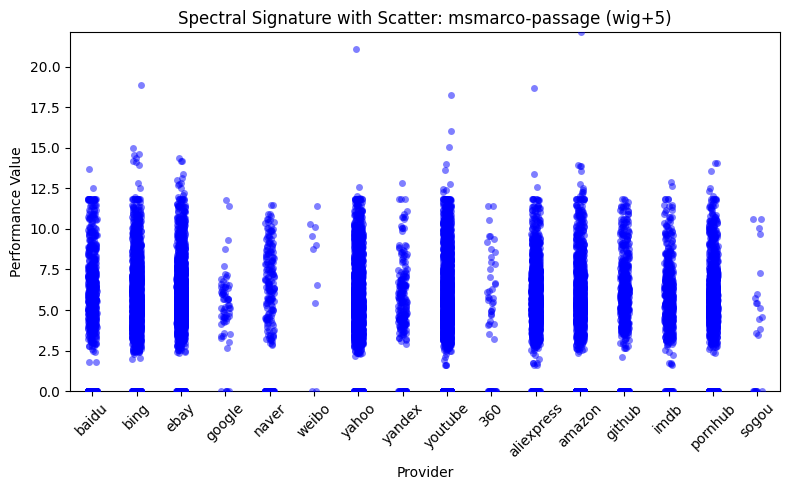

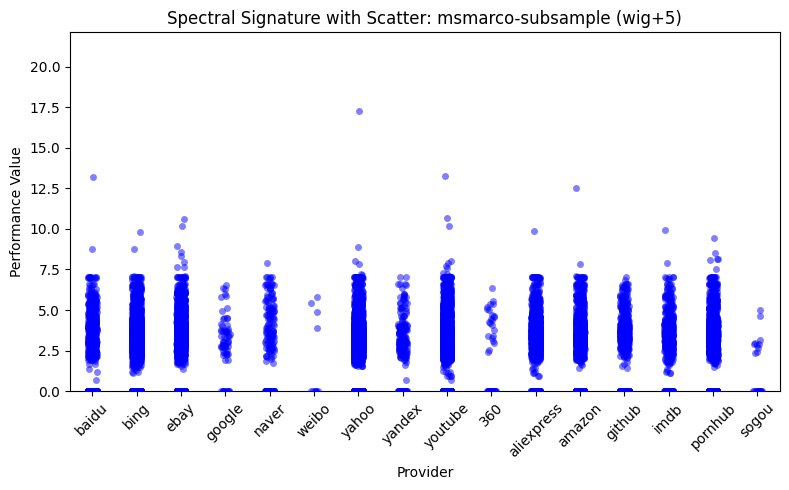

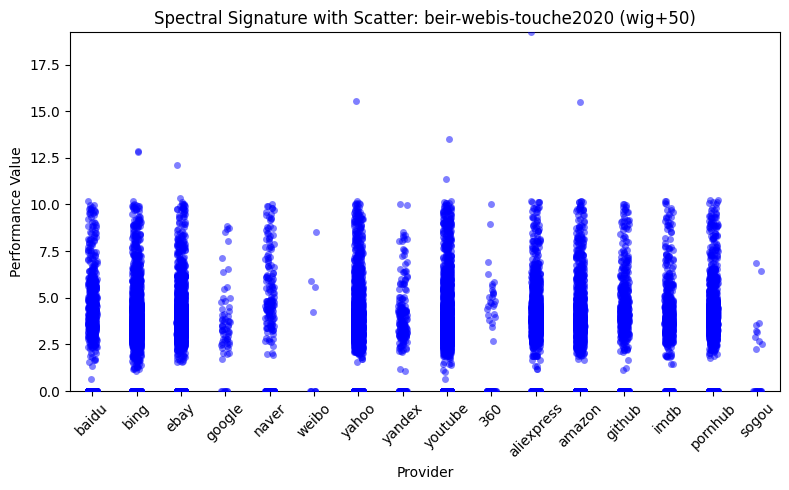

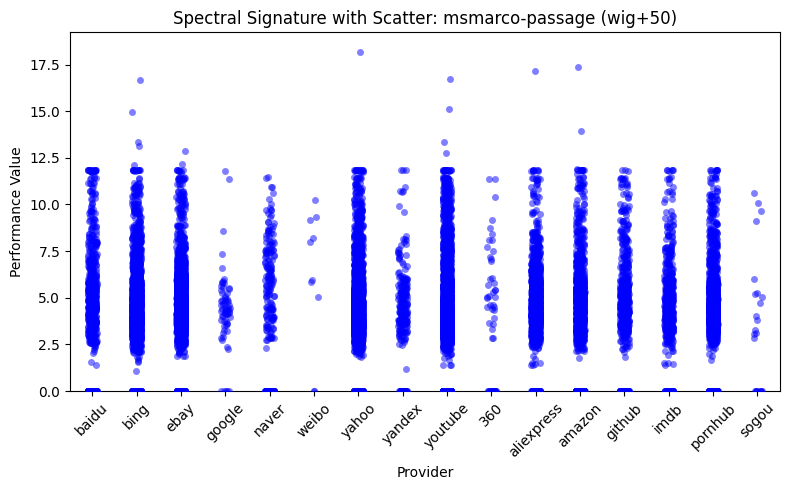

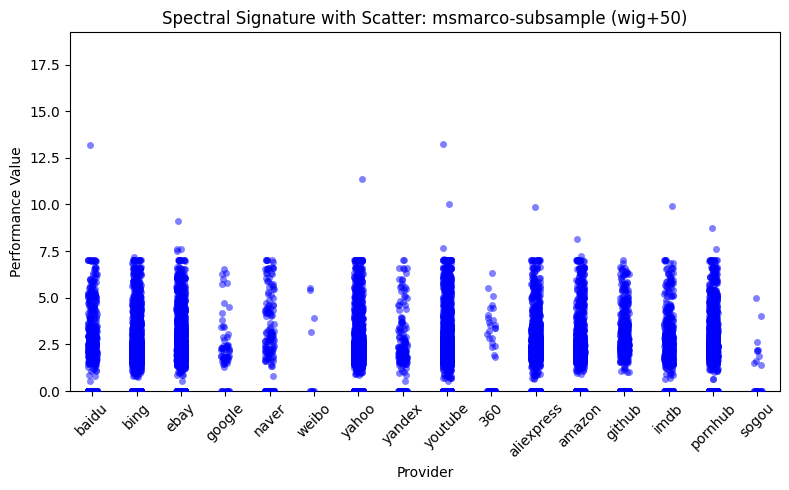

In [46]:
for metric, metric_df in result.groupby('metric'):
    max_val = metric_df['value'].max()
    min_val = metric_df['value'].min()
    for dataset, sub_df in metric_df.groupby('dataset'):
        # Compute the mean and standard error across queries for each provider.
        agg_df = sub_df.groupby('provider').agg(
            mean_value=('value', 'mean'),
            std_value=('value', 'std'),
            count=('value', 'count')
        ).reset_index()
        agg_df['se'] = agg_df['std_value'] / np.sqrt(agg_df['count'])
        # Ensure providers are in a consistent order.
        agg_df = agg_df.sort_values('provider')
        
        plt.figure(figsize=(8, 5))
        # Plot the individual query performance values with jitter.
        sns.stripplot(data=sub_df, x='provider', y='value', color='blue',
                      jitter=True, alpha=0.5)
        
        # Overlay the spectral signature: mean values with error bars.
        #plt.errorbar(agg_df['provider'], agg_df['mean_value'], yerr=agg_df['se'],marker='o', linestyle='-', capsize=5, color='red')
        
        plt.ylim(min_val, max_val)
        plt.title(f"Spectral Signature with Scatter: {dataset} ({metric})")
        plt.xlabel("Provider")
        plt.ylabel("Performance Value")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()